In [2]:
using Plots, LaTeXStrings, StatsBase
using JSON
# Establishing Imports
include("diffusion.jl")
include("run_and_tumble.jl")

using .Diffusion, .RunAndTumble

# Plotting defaults
default(title="", ylabel="y label", xlabel="x label", linewidth=1.5, guidefontsize=15, legendfontsize=11,
    # guidefont=(15, "Computer Modern"), tickfont=(11, "Computer Modern"), legendfont=(11, "Computer Modern"),
    size=(800, 600), dpi=600, margin=8Plots.mm, framestyle=:box)


# const DARKBLUE = "#084081"
# const BLUE1 = "#2b8cbe"
# const BLUE2 = "#4eb3d3"
# const BLUE3 = "#7bccc4"
# const LIGHTGREEN = "#a8ddb5"

const DARKBLUE = "#253494"
const BLUE1 = "#225ea8"
const BLUE2 = "#1d91c0"
const BLUE3 = "#7fcdbb"
const LIGHTGREEN = "#c7e9b4"

log_range = (start, stop, length) -> 10 .^ (range(log10(start), log10(stop), length))

# :==== TITLE TEMPLATE ====:

# TIPS:
# 4x3 aspect ratio
# labels approx same size as caption font
# 800, 600 gets placed at 0.8 page width

#11 (generic function with 1 method)

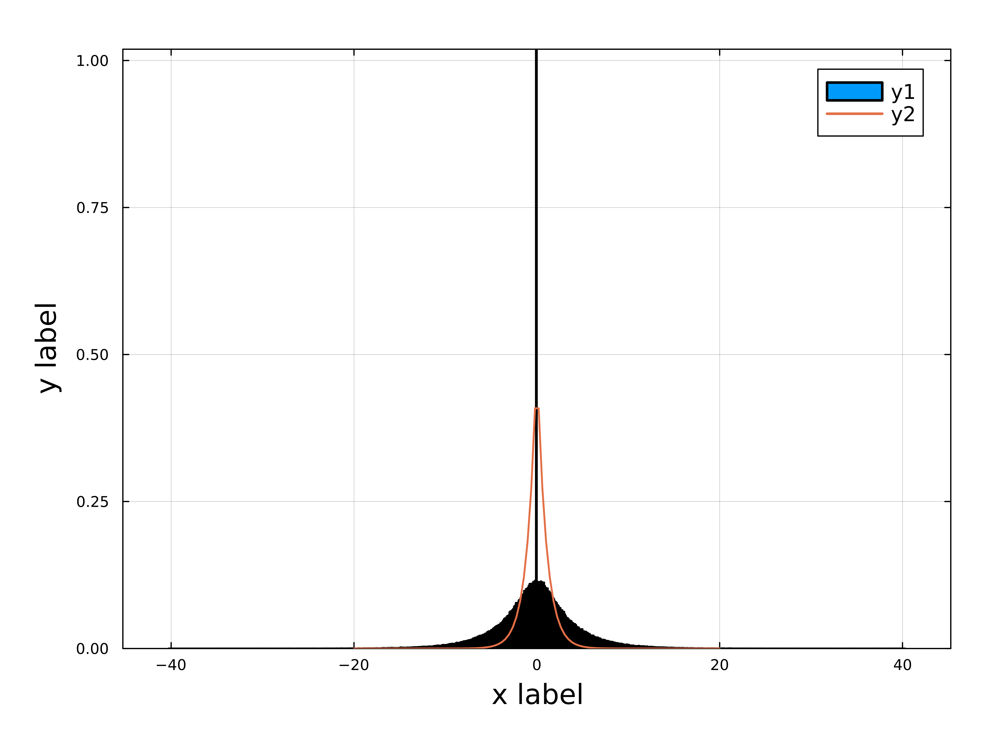

In [3]:
position_data = JSON.parsefile("./data/PositionsData.json")
pos = position_data["array"]

x = range(-20, 20, 100)

histogram(pos, normalize=:pdf)
plot!(x, x -> Diffusion.p_st(x, 0, 1))

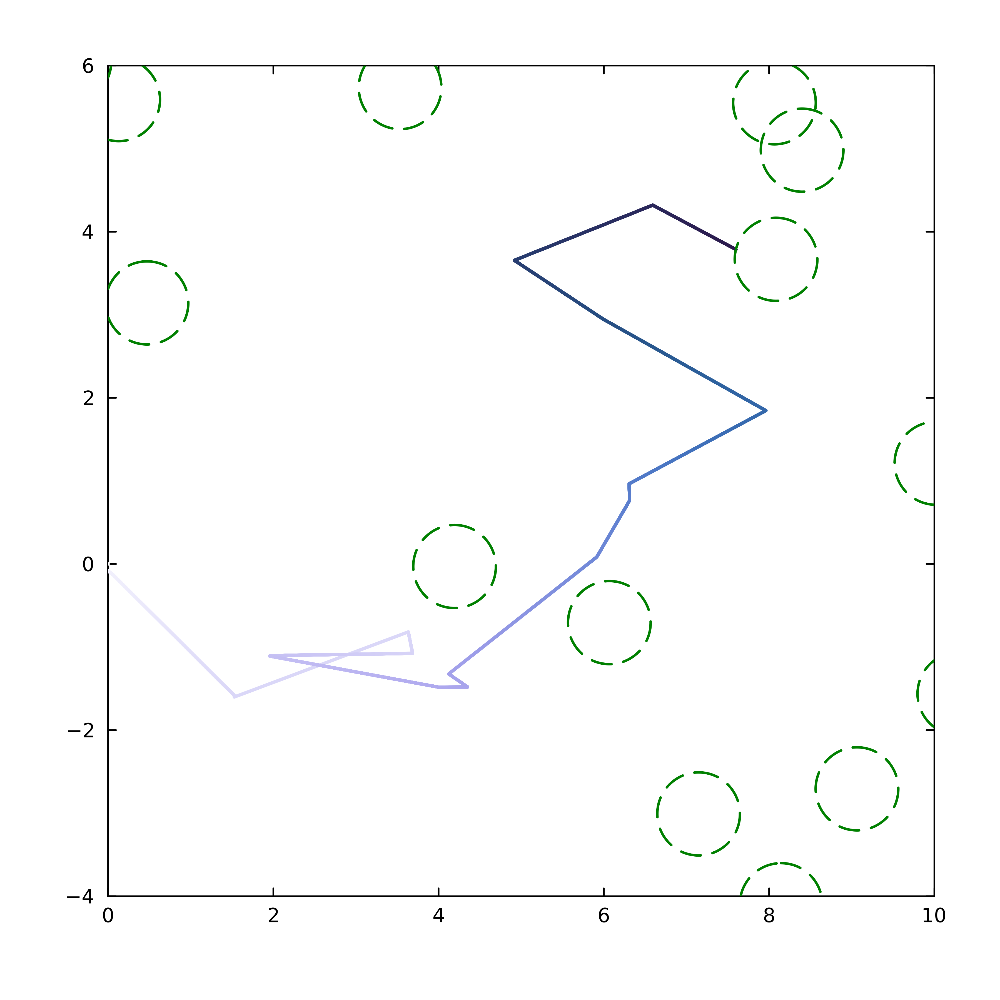

In [3]:
RTP_data = JSON.parsefile("./data/RTP_move_data.json")
x, y, traps, resets = RTP_data["x"], RTP_data["y"], RTP_data["traps"], RTP_data["resets"]

plt = plot(xlabel="", ylabel="", size=(600, 600), xrange=(0, 10), yrange=(-4, 6), grid=false)
plot!(x, y, linez=range(1, 0, length(x)), label="RTP Movement", c=:devon, legend=:none, colorbar=false, linewidth=2)

function circle(x, y, r)
    θ = range(0, 2*pi, 1000)
    return x .+ r*sin.(θ), y .+ r*cos.(θ)
end

a = 0.5
for trap in traps
    trap_x, trap_y = trap
    plot!(circle(trap_x, trap_y, a), legend=:none, c=:green, linestyle=:dash)
end
plt

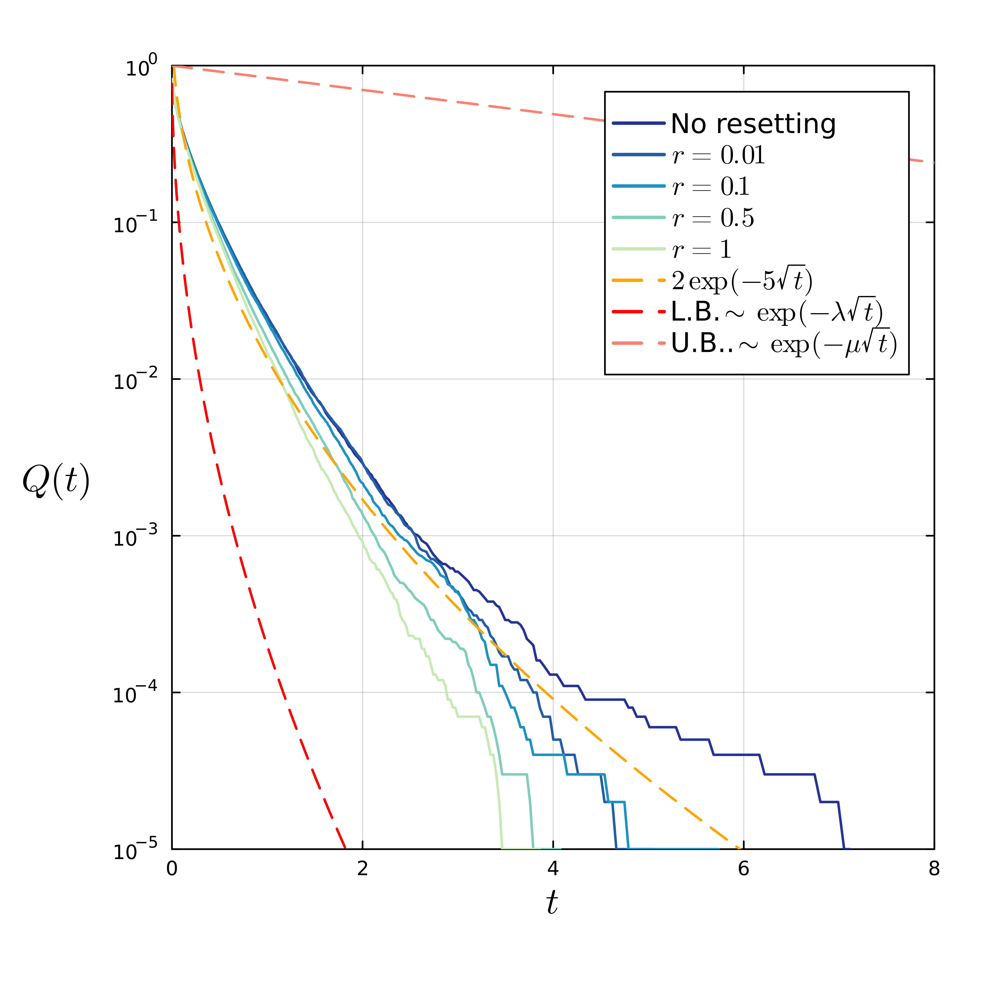

In [90]:
trap_decay_data = JSON.parsefile("./data/2D_diffusion_static_traps.json")
Q_0, Q_r1, Q_r2, Q_r3, Q_r4 = trap_decay_data["Q_0"], trap_decay_data["Q_r1"],
    trap_decay_data["Q_r2"], trap_decay_data["Q_r3"], trap_decay_data["Q_r4"]

Q_0 = convert(Vector{Real}, Q_0)
Q_r1 = convert(Vector{Real}, Q_r1)
Q_r2 = convert(Vector{Real}, Q_r2)
Q_r3 = convert(Vector{Real}, Q_r3)
Q_r4 = convert(Vector{Real}, Q_r4)


cdf_0 = ecdf(Q_0)
cdf_r1 = ecdf(Q_r1)
cdf_r2 = ecdf(Q_r2)
cdf_r4 = ecdf(Q_r4)
cdf_r3 = ecdf(Q_r3)


x = log_range(0.001, 8, 1000)

plt = plot(size=(600, 600), ylabel=L"Q(t)", xlabel=L"t", yscale=:log, yguidefontrotation=-90, yrange=(10^-5, 1), xrange=(0, 8))

plot!(x, x -> 1 - cdf_0(x), label="No resetting", c=DARKBLUE)
plot!(x, x -> 1 - cdf_r1(x), label=L"r=0.01", c=BLUE1)
plot!(x, x -> 1 - cdf_r2(x), label=L"r=0.1", c=BLUE2)
plot!(x, x -> 1 - cdf_r3(x), label=L"r=0.5", c=BLUE3)
plot!(x, x -> 1 - cdf_r4(x), label=L"r=1", c=LIGHTGREEN)

z_0, ρ, D, r, a,= 2.40483, 1, 1, 1, 0.25
λ = 2z_0*sqrt(pi)*(ρ^(1/2))*sqrt(D)
μ = (1 - exp(-ρ*pi*a^2))

plot!(x, 2exp.(-5 * sqrt.(x)), linestyle=:dash, label=L"2\exp(-5\sqrt{t})", c=:orange)
plot!(x, exp.(-λ * sqrt.(x)), linestyle=:dash, label="L.B."*L"\sim\exp(-λ \sqrt{t})", c=:red)
plot!(x, exp.(-μ * x), linestyle=:dash, label="U.B.."*L"\sim\exp(-μ \sqrt{t})", c=:salmon)
#plot!(x, exp.(-2.8 * x)/3, linestyle=:dash, label="exp(-t)", c=:red)


#savefig("./figures/sea_of_traps_sim/poisson.pdf")

plt

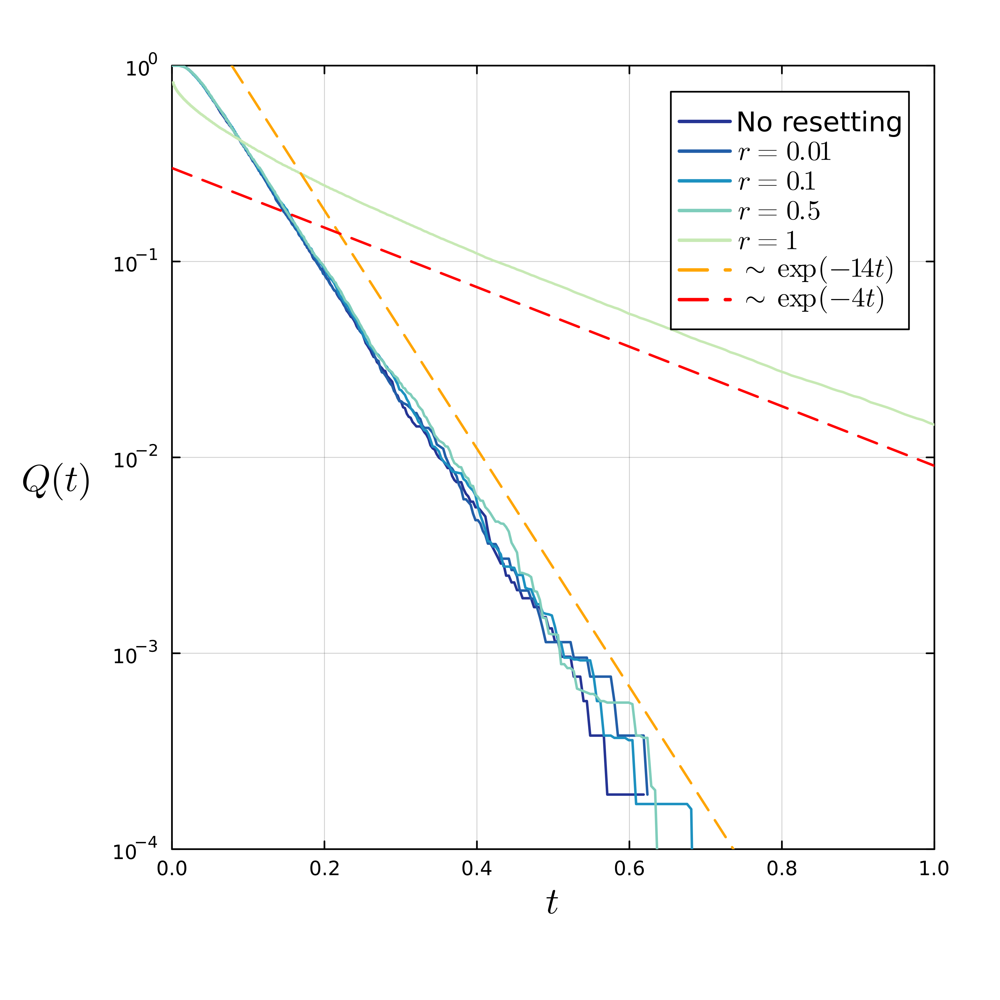

In [84]:
trap_decay_data = JSON.parsefile("./data/2D_diffusion_uniform_traps.json")
Q_0, Q_r1, Q_r2, Q_r3 = trap_decay_data["Q_0"], trap_decay_data["Q_r1"],
    trap_decay_data["Q_r2"], trap_decay_data["Q_r3"]

Q_0 = convert(Vector{Real}, Q_0)
Q_r1 = convert(Vector{Real}, Q_r1)
Q_r2 = convert(Vector{Real}, Q_r2)
Q_r3 = convert(Vector{Real}, Q_r3)


cdf_0 = ecdf(Q_0)
cdf_r1 = ecdf(Q_r1)
cdf_r2 = ecdf(Q_r2)
cdf_r4 = ecdf(Q_r4)
cdf_r3 = ecdf(Q_r3)


x = log_range(0.001, 3, 1000)

plt = plot(size=(600, 600), ylabel=L"Q(t)", xlabel=L"t", yscale=:log, yguidefontrotation=-90, yrange=(10^-4, 1), xrange=(0, 1))

plot!(x, x -> 1 - cdf_0(x), label="No resetting", c=DARKBLUE)
plot!(x, x -> 1 - cdf_r1(x), label=L"r=0.01", c=BLUE1)
plot!(x, x -> 1 - cdf_r2(x), label=L"r=0.1", c=BLUE2)
plot!(x, x -> 1 - cdf_r3(x), label=L"r=0.5", c=BLUE3)
plot!(x, x -> 1 - cdf_r4(x), label=L"r=1", c=LIGHTGREEN)

plot!(x, 3exp.(-14 * x), linestyle=:dash, label=L"\sim\exp(-14t)", c=:orange)
plot!(x, .3exp.(-3.5 * x), linestyle=:dash, label=L"\sim\exp(-4t)", c=:red)

savefig("./figures/sea_of_traps_sim/uniform.pdf")

plt

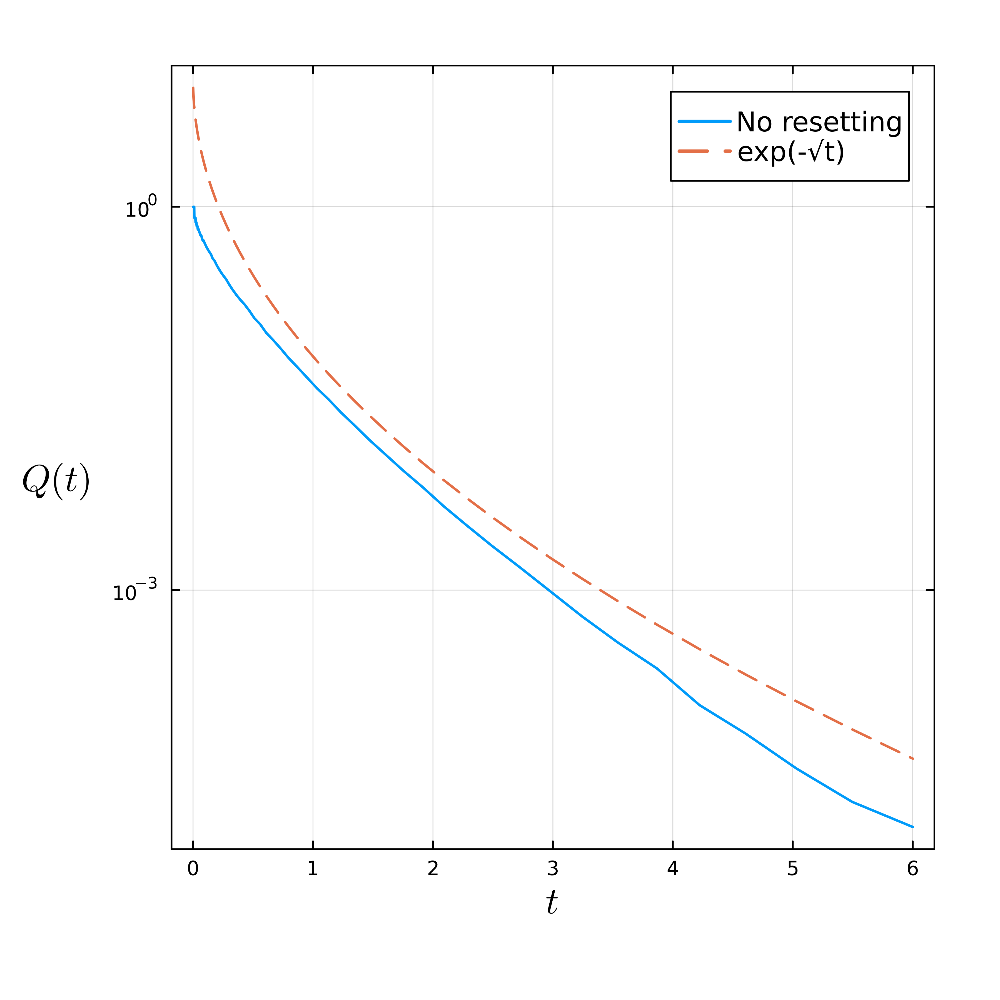

In [31]:
no_resetting_data = JSON.parsefile("./data/2d_diffusion_static_traps_noreset_notrap.json")
Q = no_resetting_data["Q"]

Q = convert(Vector{Real}, Q)

Q_ecdf = ecdf(Q)

x = log_range(0.001, 6, 100)

plt = plot(size=(600, 600), ylabel=L"Q(t)", xlabel=L"t", yscale=:log, yguidefontrotation=-90)
plot!(x, x -> 1 - Q_ecdf(x), label="No resetting")
plot!(x, 10 * exp.(-5 * sqrt.(x)), linestyle=:dash, label="exp(-√t)")